Peace Choi's Machine Learning Classification Project: 

I downloaded ‘Crime Data from 2020 to Present.csv’ from https://data.gov/ and used Python to run data analytics and find a predictive classification modeling between X variable (crime area, victim descent, victim age, victim sex) and Y variable (types of crime). 

Can I predict types of crime based on crime area, victim descent, victim age, and/or victim sex with high confidence of above 90% accuracy score? 

I imported sklearn, pandas, seaborn, matplotlib.pyplot and numpy libraries. I used classification modeling Support Vector Machine (SVM), preprocessing function called LabelEncoder to convert categorical data to numerical data which is necessary for classification. I split the data by train and test as 70:30. There were no notable correlations between any of the two columns. Of the entire 200,000 rows, I ran a sample of 5,000 rows to produce an accuracy score to predict types of crime based on crime area, victim descent, victim age, and/or victim sex and the accuracy score was only 28.6%. 

I cannot confidently predict types of crime based on factors such as crime area, victim descent, victim age, and/or victim sex.     


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

df = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

In [2]:
print (df.head())
print (df.columns)
df.shape

       DR_NO               Date Rptd                DATE OCC  TIME OCC  AREA  \
0   10304468  01/08/2020 12:00:00 AM  01/08/2020 12:00:00 AM      2230     3   
1  190101086  01/02/2020 12:00:00 AM  01/01/2020 12:00:00 AM       330     1   
2  200110444  04/14/2020 12:00:00 AM  02/13/2020 12:00:00 AM      1200     1   
3  191501505  01/01/2020 12:00:00 AM  01/01/2020 12:00:00 AM      1730    15   
4  191921269  01/01/2020 12:00:00 AM  01/01/2020 12:00:00 AM       415    19   

     AREA NAME  Rpt Dist No  Part 1-2  Crm Cd  \
0    Southwest          377         2     624   
1      Central          163         2     624   
2      Central          155         2     845   
3  N Hollywood         1543         2     745   
4      Mission         1998         2     740   

                                         Crm Cd Desc  ... Status  \
0                           BATTERY - SIMPLE ASSAULT  ...     AO   
1                           BATTERY - SIMPLE ASSAULT  ...     IC   
2          SEX OFFEN

(820599, 28)

In [3]:
df.columns

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'Crm Cd 1',
       'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'LOCATION', 'Cross Street', 'LAT',
       'LON'],
      dtype='object')

In [4]:
df.describe()


,DR_NO,TIME OCC,AREA,Rpt Dist No,Part 1-2,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON
count,8.205990e+05,820599.000000,820599.000000,820599.000000,820599.000000,820599.000000,820599.000000,820589.000000,286078.000000,820589.000000,60413.000000,2025.000000,60.000000,820599.000000,820599.000000
mean,2.161299e+08,1335.627492,10.711722,1117.592487,1.413828,500.803992,29.806031,305.759386,362.916586,500.542192,957.477927,983.615309,990.750000,33.604765,-116.725860
std,1.083045e+07,654.020941,6.093656,609.360686,0.492519,207.807715,21.776511,216.670080,123.754162,207.596108,111.524441,52.844921,27.908218,3.970446,13.786369
min,8.170000e+02,1.000000,1.000000,101.000000,1.000000,110.000000,-3.000000,101.000000,101.000000,110.000000,210.000000,310.000000,821.000000,0.000000,-118.667600
25%,2.102046e+08,900.000000,6.000000,621.000000,1.000000,331.000000,7.000000,101.000000,310.000000,331.000000,998.000000,998.000000,998.000000,34.010200,-118.428700
50%,2.201176e+08,1415.000000,11.000000,1142.000000,1.000000,442.000000,31.000000,203.000000,400.000000,442.000000,998.000000,998.000000,998.000000,34.057500,-118.319300
75%,2.220056e+08,1900.000000,16.000000,1617.000000,2.000000,626.000000,45.000000,501.000000,400.000000,626.000000,998.000000,998.000000,998.000000,34.161600,-118.273100
max,2.399165e+08,2359.000000,21.000000,2199.000000,2.000000,956.000000,120.000000,976.000000,516.000000,956.000000,999.000000,999.000000,999.000000,34.334300,0.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 820599 entries, 0 to 820598
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           820599 non-null  int64  
 1   Date Rptd       820599 non-null  object 
 2   DATE OCC        820599 non-null  object 
 3   TIME OCC        820599 non-null  int64  
 4   AREA            820599 non-null  int64  
 5   AREA NAME       820599 non-null  object 
 6   Rpt Dist No     820599 non-null  int64  
 7   Part 1-2        820599 non-null  int64  
 8   Crm Cd          820599 non-null  int64  
 9   Crm Cd Desc     820599 non-null  object 
 10  Mocodes         707114 non-null  object 
 11  Vict Age        820599 non-null  int64  
 12  Vict Sex        712653 non-null  object 
 13  Vict Descent    712645 non-null  object 
 14  Premis Cd       820589 non-null  float64
 15  Premis Desc     820116 non-null  object 
 16  Weapon Used Cd  286078 non-null  float64
 17  Weapon Des

In [6]:
df.nunique()

DR_NO             820599
Date Rptd           1385
DATE OCC            1385
TIME OCC            1439
AREA                  21
AREA NAME             21
Rpt Dist No         1205
Part 1-2               2
Crm Cd               138
Crm Cd Desc          138
Mocodes           273856
Vict Age             103
Vict Sex               5
Vict Descent          20
Premis Cd            313
Premis Desc          306
Weapon Used Cd        79
Weapon Desc           79
Status                 6
Status Desc            6
Crm Cd 1             140
Crm Cd 2             123
Crm Cd 3              37
Crm Cd 4               6
LOCATION           63719
Cross Street        9688
LAT                 5399
LON                 4970
dtype: int64

In [7]:
df['Crm Cd'] #Crm Cd corresponds to Crm Cd Desc

0         624
1         624
2         845
3         745
4         740
         ... 
820594    740
820595    230
820596    230
820597    352
820598    745
Name: Crm Cd, Length: 820599, dtype: int64

In [8]:
df['Crm Cd Desc']

0                                  BATTERY - SIMPLE ASSAULT
1                                  BATTERY - SIMPLE ASSAULT
2                 SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
3                  VANDALISM - MISDEAMEANOR ($399 OR UNDER)
4         VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...
                                ...                        
820594    VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...
820595       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
820596       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
820597                                           PICKPOCKET
820598             VANDALISM - MISDEAMEANOR ($399 OR UNDER)
Name: Crm Cd Desc, Length: 820599, dtype: object

In [9]:
df['Mocodes'] #Los Angeles Mo Codes are for activities. 0100 is Suspect Impersonate, 0209 is Mask 

0                   0444 0913
1              0416 1822 1414
2                        1501
3                   0329 1402
4                        0329
                 ...         
820594              1300 0329
820595         0416 0411 1822
820596    0601 0445 0416 0359
820597              1822 0344
820598              0329 1822
Name: Mocodes, Length: 820599, dtype: object

In [10]:
mocodes_str=df.Mocodes.str #turn Mocodes to string 
print('this is max',mocodes_str.len().max())
print('this is min', mocodes_str.len().min())
print('this is the row with minimum mocodes:', mocodes_str.len().idxmin())
print('this is the row with maximum mocodes:', mocodes_str.len().idxmax())
print('max is 10 Mocodes: row 19', df.Mocodes.iloc[19])
print ('min is 1 Mocode: row2', df.Mocodes.iloc[2])

this is max 49.0
this is min 4.0
this is the row with minimum mocodes: 2
this is the row with maximum mocodes: 19
max is 10 Mocodes: row 19 0416 0411 0344 1822 0305 0334 2004 1414 1202 1218
min is 1 Mocode: row2 1501


In [11]:
#df['Vict Age'] 
#df['Vict Age'].value_counts()
#df[df['Vict Age']<0] #to see negative victim age population
#df.groupby('Vict Age').count().sort_values(by=['DR_NO'])
#How many numbers less than zero? For example, less than 1, 2, 3, etc...
print (df[df['Vict Age']<0]['Vict Age'].value_counts())
#print(df[df['Vict Age']<0]['Vict Age'].value_counts()) #value_counts work on only one column, that's why I needed a second ['Vict Age']
#look at the meta data. If the meta data can't explain the negative victim age, then drop the data since it's garbage

-1    56
-2    13
-3     1
Name: Vict Age, dtype: int64


In [12]:
df=df[df['Vict Age']>=0] #this is alternative to df.drop, simpler way 
print(df['Vict Age']<0)
         

0         False
1         False
2         False
3         False
4         False
          ...  
820594    False
820595    False
820596    False
820597    False
820598    False
Name: Vict Age, Length: 820529, dtype: bool


In [13]:
df.drop(index=df[df['Vict Age']<0].index,inplace = True) 
df['Vict Age'].value_counts() #all the negative Vict Age 
df[df['Vict Age']<0]['Vict Age'].count()

0

In [14]:
#df['Vict Sex'] #Drop X 
print (df['Vict Sex'].unique())
print (df['Vict Sex'].nunique())
df['Vict Sex'].value_counts() #'X' means unindentified sex
#df[df['Vict Sex']=='X']
#I can define X as undefined 

#df.replace('H','X', inplace=True) # this may replace below function as well 

def transition(N): #above df.replace works well stead of this transition func
    if N == 'H':    
        return 'X'
    else:
        return N
    
df['Vict Sex'].apply(transition)#this ensures only column 'Vict Sex' is applicable 

    

['F' 'M' 'X' nan 'H' '-']
5


0         F
1         M
2         X
3         F
4         X
         ..
820594    M
820595    F
820596    M
820597    F
820598    F
Name: Vict Sex, Length: 820529, dtype: object

In [15]:
df['Vict Sex'].unique()

array(['F', 'M', 'X', nan, 'H', '-'], dtype=object)

In [16]:
df[df['Vict Sex']=='H']

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
1512,200204197,01/03/2020 12:00:00 AM,01/03/2020 12:00:00 AM,2200,2,Rampart,237,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,1600 W 2ND ST,NaN,34.0613,-118.2638
1835,200204938,01/20/2020 12:00:00 AM,01/20/2020 12:00:00 AM,40,2,Rampart,238,1,251,SHOTS FIRED AT INHABITED DWELLING,...,IC,Invest Cont,251.0,998.0,NaN,NaN,100 N TOLUCA ST,NaN,34.0616,-118.2586
4583,200504351,01/08/2020 12:00:00 AM,01/07/2020 12:00:00 AM,1100,5,Harbor,566,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,200 W 12TH ST,NaN,33.7333,-118.2814
15033,200714556,10/05/2020 12:00:00 AM,10/05/2020 12:00:00 AM,200,7,Wilshire,769,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,IC,Invest Cont,230.0,NaN,NaN,NaN,15TH ST,2ND AV,34.0454,-118.3189
16324,200708374,04/14/2020 12:00:00 AM,04/14/2020 12:00:00 AM,1300,7,Wilshire,721,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,NaN,NaN,NaN,8500 COLGATE AV,NaN,34.0709,-118.3764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772678,232011949,06/23/2023 12:00:00 AM,06/23/2023 12:00:00 AM,240,20,Olympic,2073,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,NaN,NaN,NaN,2900 W 15TH ST,NaN,34.0454,-118.3061
778947,230908111,04/13/2023 12:00:00 AM,04/12/2023 12:00:00 AM,1530,9,Van Nuys,923,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,NaN,NaN,NaN,VANOWEN,CEDROS,34.1940,-118.4531
780392,232012744,07/12/2023 12:00:00 AM,07/11/2023 12:00:00 AM,1400,20,Olympic,2069,1,440,THEFT PLAIN - PETTY ($950 & UNDER),...,IC,Invest Cont,440.0,NaN,NaN,NaN,1100 ARAPAHOE ST,NaN,34.0508,-118.2854
791446,230407032,04/02/2023 12:00:00 AM,04/02/2023 12:00:00 AM,1530,4,Hollenbeck,497,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,3300 HUNTER ST,NaN,34.0202,-118.2063


### 
Converting below columns to date time object
Date Rptd       820599 non-null  object 
DATE OCC        820599 non-null  object 
TIME OCC        820599 non-null  int64  

In [17]:
for I in ['Date Rptd', 'DATE OCC', 'TIME OCC']: 
    df[I]=pd.to_datetime(df[I])
    

In [18]:
for i in df['Date Rptd']: #this is to understand above for loop code as to why we're only using the column names and not df['DATE OCC']
    print (i)

2020-01-08 00:00:00
2020-01-02 00:00:00
2020-04-14 00:00:00
2020-01-01 00:00:00
2020-01-01 00:00:00
2020-01-02 00:00:00
2020-01-02 00:00:00
2020-01-04 00:00:00
2020-01-04 00:00:00
2020-06-19 00:00:00
2020-01-04 00:00:00
2020-01-05 00:00:00
2020-01-05 00:00:00
2020-01-07 00:00:00
2020-01-08 00:00:00
2021-11-26 00:00:00
2020-11-29 00:00:00
2020-02-22 00:00:00
2021-11-22 00:00:00
2020-01-14 00:00:00
2020-09-10 00:00:00
2020-01-14 00:00:00
2020-01-15 00:00:00
2021-11-18 00:00:00
2020-01-15 00:00:00
2021-11-29 00:00:00
2020-02-15 00:00:00
2020-01-19 00:00:00
2020-10-15 00:00:00
2020-01-20 00:00:00
2020-01-23 00:00:00
2021-11-24 00:00:00
2020-07-29 00:00:00
2020-09-15 00:00:00
2020-01-27 00:00:00
2021-11-29 00:00:00
2020-12-04 00:00:00
2020-08-27 00:00:00
2020-01-28 00:00:00
2020-06-20 00:00:00
2020-01-30 00:00:00
2020-01-30 00:00:00
2020-01-31 00:00:00
2020-02-04 00:00:00
2020-02-04 00:00:00
2022-06-15 00:00:00
2020-02-06 00:00:00
2020-12-11 00:00:00
2020-11-26 00:00:00
2020-02-08 00:00:00


2020-12-24 00:00:00
2020-04-22 00:00:00
2020-09-05 00:00:00
2020-05-08 00:00:00
2020-04-23 00:00:00
2020-04-21 00:00:00
2020-04-29 00:00:00
2020-04-27 00:00:00
2020-06-14 00:00:00
2020-02-27 00:00:00
2020-04-19 00:00:00
2020-04-24 00:00:00
2020-06-25 00:00:00
2020-04-23 00:00:00
2020-04-15 00:00:00
2020-10-24 00:00:00
2020-07-16 00:00:00
2020-04-20 00:00:00
2020-04-13 00:00:00
2020-04-26 00:00:00
2020-12-03 00:00:00
2020-05-14 00:00:00
2020-12-04 00:00:00
2020-05-04 00:00:00
2020-06-09 00:00:00
2020-04-24 00:00:00
2020-04-27 00:00:00
2020-06-13 00:00:00
2020-04-24 00:00:00
2020-04-27 00:00:00
2020-04-19 00:00:00
2020-06-05 00:00:00
2020-10-17 00:00:00
2020-01-28 00:00:00
2020-02-27 00:00:00
2020-06-15 00:00:00
2020-07-03 00:00:00
2020-04-22 00:00:00
2020-04-05 00:00:00
2020-06-11 00:00:00
2020-04-21 00:00:00
2020-07-21 00:00:00
2020-08-25 00:00:00
2020-04-13 00:00:00
2020-02-25 00:00:00
2020-09-25 00:00:00
2020-04-20 00:00:00
2020-12-05 00:00:00
2020-05-20 00:00:00
2020-01-31 00:00:00


2020-08-10 00:00:00
2020-06-11 00:00:00
2020-01-18 00:00:00
2020-05-27 00:00:00
2020-08-17 00:00:00
2020-06-24 00:00:00
2020-05-17 00:00:00
2020-10-07 00:00:00
2020-04-30 00:00:00
2020-10-20 00:00:00
2020-03-08 00:00:00
2020-05-24 00:00:00
2020-02-09 00:00:00
2020-03-19 00:00:00
2020-08-10 00:00:00
2020-09-01 00:00:00
2020-01-19 00:00:00
2020-10-26 00:00:00
2020-08-15 00:00:00
2020-05-08 00:00:00
2020-07-21 00:00:00
2020-08-10 00:00:00
2020-02-27 00:00:00
2020-01-21 00:00:00
2020-08-14 00:00:00
2020-08-11 00:00:00
2020-08-14 00:00:00
2020-06-18 00:00:00
2020-07-05 00:00:00
2020-01-22 00:00:00
2020-07-27 00:00:00
2020-03-28 00:00:00
2020-11-15 00:00:00
2020-08-26 00:00:00
2020-08-24 00:00:00
2020-08-15 00:00:00
2020-10-23 00:00:00
2020-12-01 00:00:00
2020-12-03 00:00:00
2020-08-15 00:00:00
2020-02-02 00:00:00
2020-08-15 00:00:00
2020-08-15 00:00:00
2020-10-27 00:00:00
2020-10-06 00:00:00
2020-03-06 00:00:00
2020-04-17 00:00:00
2020-03-06 00:00:00
2020-08-16 00:00:00
2020-08-16 00:00:00


2020-11-28 00:00:00
2020-10-31 00:00:00
2020-11-29 00:00:00
2020-11-25 00:00:00
2020-10-24 00:00:00
2020-04-30 00:00:00
2020-06-09 00:00:00
2020-11-17 00:00:00
2020-09-10 00:00:00
2020-02-11 00:00:00
2020-08-24 00:00:00
2020-02-05 00:00:00
2020-06-14 00:00:00
2020-11-27 00:00:00
2020-06-21 00:00:00
2020-07-24 00:00:00
2020-11-29 00:00:00
2020-11-30 00:00:00
2020-09-28 00:00:00
2020-08-18 00:00:00
2020-11-28 00:00:00
2020-11-24 00:00:00
2020-08-24 00:00:00
2020-07-18 00:00:00
2020-10-20 00:00:00
2020-05-20 00:00:00
2020-01-09 00:00:00
2020-11-02 00:00:00
2020-07-09 00:00:00
2020-04-06 00:00:00
2020-11-27 00:00:00
2020-11-27 00:00:00
2020-06-25 00:00:00
2020-11-26 00:00:00
2020-02-19 00:00:00
2020-10-18 00:00:00
2020-07-08 00:00:00
2020-11-27 00:00:00
2020-03-25 00:00:00
2020-05-10 00:00:00
2020-11-23 00:00:00
2020-08-07 00:00:00
2020-08-09 00:00:00
2020-06-27 00:00:00
2020-04-23 00:00:00
2020-02-19 00:00:00
2020-11-22 00:00:00
2020-10-03 00:00:00
2020-11-22 00:00:00
2020-11-28 00:00:00


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2021-01-20 00:00:00
2021-07-08 00:00:00
2021-04-14 00:00:00
2021-02-20 00:00:00
2021-01-24 00:00:00
2021-07-16 00:00:00
2021-11-02 00:00:00
2021-11-15 00:00:00
2021-10-21 00:00:00
2021-07-01 00:00:00
2021-05-28 00:00:00
2021-09-15 00:00:00
2021-08-06 00:00:00
2021-10-04 00:00:00
2021-11-03 00:00:00
2021-06-12 00:00:00
2021-04-06 00:00:00
2021-10-10 00:00:00
2021-05-05 00:00:00
2021-05-19 00:00:00
2021-08-21 00:00:00
2021-12-20 00:00:00
2021-02-24 00:00:00
2021-07-26 00:00:00
2021-04-05 00:00:00
2021-03-19 00:00:00
2021-07-18 00:00:00
2021-11-15 00:00:00
2021-07-30 00:00:00
2021-07-04 00:00:00
2021-10-04 00:00:00
2021-06-15 00:00:00
2021-07-03 00:00:00
2021-12-13 00:00:00
2021-08-30 00:00:00
2021-03-12 00:00:00
2021-06-23 00:00:00
2021-11-15 00:00:00
2021-12-13 00:00:00
2021-05-16 00:00:00
2021-04-25 00:00:00
2021-09-15 00:00:00
2021-04-25 00:00:00
2021-05-18 00:00:00
2021-02-16 00:00:00
2021-05-10 00:00:00
2021-09-25 00:00:00
2022-12-28 00:00:00
2021-05-17 00:00:00
2021-03-20 00:00:00

2021-02-18 00:00:00
2021-01-13 00:00:00
2021-01-09 00:00:00
2021-04-18 00:00:00
2021-10-06 00:00:00
2021-04-27 00:00:00
2021-10-16 00:00:00
2021-12-25 00:00:00
2021-03-15 00:00:00
2021-11-09 00:00:00
2021-06-20 00:00:00
2021-09-30 00:00:00
2021-03-06 00:00:00
2021-05-09 00:00:00
2021-07-31 00:00:00
2021-01-06 00:00:00
2021-08-11 00:00:00
2021-08-07 00:00:00
2021-06-19 00:00:00
2021-12-22 00:00:00
2021-12-02 00:00:00
2021-06-19 00:00:00
2021-04-23 00:00:00
2021-09-04 00:00:00
2021-09-01 00:00:00
2021-07-29 00:00:00
2021-06-16 00:00:00
2021-06-22 00:00:00
2021-12-07 00:00:00
2021-06-23 00:00:00
2021-10-25 00:00:00
2021-07-27 00:00:00
2021-03-25 00:00:00
2021-08-17 00:00:00
2021-01-09 00:00:00
2021-03-29 00:00:00
2021-02-09 00:00:00
2021-01-11 00:00:00
2021-02-01 00:00:00
2021-09-29 00:00:00
2021-07-04 00:00:00
2021-02-27 00:00:00
2021-09-28 00:00:00
2021-01-23 00:00:00
2021-04-20 00:00:00
2021-12-06 00:00:00
2021-05-21 00:00:00
2021-12-04 00:00:00
2021-09-10 00:00:00
2021-03-07 00:00:00


2021-11-02 00:00:00
2021-02-01 00:00:00
2021-02-10 00:00:00
2021-05-14 00:00:00
2021-08-06 00:00:00
2021-07-29 00:00:00
2021-12-08 00:00:00
2021-06-24 00:00:00
2021-09-26 00:00:00
2021-04-09 00:00:00
2021-09-14 00:00:00
2021-08-29 00:00:00
2021-07-08 00:00:00
2021-05-17 00:00:00
2021-11-09 00:00:00
2021-06-05 00:00:00
2021-02-07 00:00:00
2021-02-01 00:00:00
2021-05-06 00:00:00
2021-09-30 00:00:00
2021-04-08 00:00:00
2021-04-15 00:00:00
2021-09-01 00:00:00
2021-02-03 00:00:00
2021-11-18 00:00:00
2021-01-13 00:00:00
2021-01-09 00:00:00
2021-02-10 00:00:00
2021-07-21 00:00:00
2021-08-16 00:00:00
2021-06-12 00:00:00
2021-03-05 00:00:00
2021-08-04 00:00:00
2021-12-16 00:00:00
2021-11-19 00:00:00
2021-01-05 00:00:00
2021-06-05 00:00:00
2021-05-16 00:00:00
2021-03-18 00:00:00
2021-06-18 00:00:00
2021-03-22 00:00:00
2021-02-15 00:00:00
2021-11-30 00:00:00
2021-12-02 00:00:00
2021-04-08 00:00:00
2021-10-01 00:00:00
2021-10-27 00:00:00
2021-05-31 00:00:00
2021-10-07 00:00:00
2021-08-12 00:00:00


2021-12-29 00:00:00
2021-08-05 00:00:00
2021-07-12 00:00:00
2021-05-03 00:00:00
2021-12-12 00:00:00
2021-09-06 00:00:00
2021-05-26 00:00:00
2021-03-07 00:00:00
2021-10-15 00:00:00
2021-01-27 00:00:00
2021-10-08 00:00:00
2021-09-07 00:00:00
2021-07-21 00:00:00
2021-12-25 00:00:00
2021-11-05 00:00:00
2021-02-06 00:00:00
2021-06-14 00:00:00
2021-06-11 00:00:00
2021-09-23 00:00:00
2021-12-04 00:00:00
2021-07-29 00:00:00
2021-10-03 00:00:00
2021-10-01 00:00:00
2021-11-29 00:00:00
2021-01-06 00:00:00
2021-12-30 00:00:00
2021-07-10 00:00:00
2021-05-20 00:00:00
2021-04-21 00:00:00
2021-12-18 00:00:00
2021-02-10 00:00:00
2021-05-29 00:00:00
2021-09-18 00:00:00
2021-02-23 00:00:00
2021-11-02 00:00:00
2021-02-15 00:00:00
2021-08-22 00:00:00
2021-11-19 00:00:00
2021-04-20 00:00:00
2021-05-22 00:00:00
2021-05-20 00:00:00
2021-05-31 00:00:00
2021-05-07 00:00:00
2021-08-26 00:00:00
2021-12-03 00:00:00
2021-08-09 00:00:00
2021-08-04 00:00:00
2021-03-23 00:00:00
2021-06-19 00:00:00
2021-08-14 00:00:00


2021-03-11 00:00:00
2021-08-30 00:00:00
2021-08-17 00:00:00
2021-11-14 00:00:00
2021-07-01 00:00:00
2021-10-26 00:00:00
2021-04-01 00:00:00
2021-12-12 00:00:00
2021-08-22 00:00:00
2021-11-07 00:00:00
2021-09-13 00:00:00
2021-02-25 00:00:00
2021-08-15 00:00:00
2021-12-05 00:00:00
2021-03-26 00:00:00
2021-04-25 00:00:00
2021-01-27 00:00:00
2021-12-04 00:00:00
2021-07-31 00:00:00
2021-07-16 00:00:00
2021-01-21 00:00:00
2021-10-20 00:00:00
2021-10-16 00:00:00
2021-11-13 00:00:00
2021-02-16 00:00:00
2021-01-24 00:00:00
2021-04-24 00:00:00
2021-05-24 00:00:00
2021-08-24 00:00:00
2021-04-26 00:00:00
2021-11-14 00:00:00
2021-01-06 00:00:00
2021-06-04 00:00:00
2021-08-24 00:00:00
2021-09-07 00:00:00
2022-01-07 00:00:00
2021-11-26 00:00:00
2021-04-14 00:00:00
2021-05-27 00:00:00
2021-01-20 00:00:00
2021-12-09 00:00:00
2021-01-14 00:00:00
2021-08-23 00:00:00
2021-03-01 00:00:00
2021-03-26 00:00:00
2021-08-05 00:00:00
2021-03-17 00:00:00
2021-11-30 00:00:00
2021-02-19 00:00:00
2021-06-16 00:00:00


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2022-09-28 00:00:00
2022-11-18 00:00:00
2022-12-24 00:00:00
2022-07-23 00:00:00
2022-07-13 00:00:00
2022-06-06 00:00:00
2022-12-06 00:00:00
2022-11-06 00:00:00
2022-05-30 00:00:00
2022-01-17 00:00:00
2022-02-10 00:00:00
2022-03-31 00:00:00
2022-06-24 00:00:00
2022-08-28 00:00:00
2022-06-02 00:00:00
2022-08-25 00:00:00
2022-08-21 00:00:00
2022-02-12 00:00:00
2022-01-27 00:00:00
2022-04-27 00:00:00
2022-10-27 00:00:00
2022-05-04 00:00:00
2022-07-13 00:00:00
2022-09-26 00:00:00
2022-09-13 00:00:00
2022-03-01 00:00:00
2022-08-01 00:00:00
2022-10-24 00:00:00
2022-01-11 00:00:00
2022-04-07 00:00:00
2022-12-11 00:00:00
2022-08-27 00:00:00
2022-09-02 00:00:00
2022-10-01 00:00:00
2022-10-19 00:00:00
2022-02-02 00:00:00
2022-07-16 00:00:00
2022-01-10 00:00:00
2022-03-10 00:00:00
2022-08-04 00:00:00
2022-06-14 00:00:00
2022-02-02 00:00:00
2022-08-24 00:00:00
2023-01-03 00:00:00
2022-09-02 00:00:00
2022-05-08 00:00:00
2022-11-09 00:00:00
2022-04-19 00:00:00
2022-05-17 00:00:00
2022-11-20 00:00:00


2023-08-24 00:00:00
2023-07-17 00:00:00
2023-05-04 00:00:00
2023-09-09 00:00:00
2023-04-19 00:00:00
2023-02-24 00:00:00
2023-06-28 00:00:00
2023-09-23 00:00:00
2023-05-09 00:00:00
2023-07-14 00:00:00
2023-06-19 00:00:00
2023-04-04 00:00:00
2023-10-12 00:00:00
2023-03-25 00:00:00
2023-08-06 00:00:00
2023-05-03 00:00:00
2023-08-19 00:00:00
2023-05-31 00:00:00
2023-07-16 00:00:00
2023-01-16 00:00:00
2023-02-17 00:00:00
2023-10-03 00:00:00
2023-09-20 00:00:00
2023-05-24 00:00:00
2023-06-06 00:00:00
2023-06-13 00:00:00
2023-05-02 00:00:00
2023-03-24 00:00:00
2023-04-19 00:00:00
2023-10-03 00:00:00
2023-09-28 00:00:00
2023-10-01 00:00:00
2023-01-23 00:00:00
2023-06-29 00:00:00
2023-08-21 00:00:00
2023-06-07 00:00:00
2023-05-09 00:00:00
2023-04-26 00:00:00
2023-02-06 00:00:00
2023-07-01 00:00:00
2023-08-30 00:00:00
2023-10-04 00:00:00
2023-05-11 00:00:00
2023-02-11 00:00:00
2023-05-22 00:00:00
2023-03-15 00:00:00
2023-06-01 00:00:00
2023-04-29 00:00:00
2023-01-05 00:00:00
2023-08-26 00:00:00


2023-03-02 00:00:00
2023-02-02 00:00:00
2023-07-23 00:00:00
2023-01-31 00:00:00
2023-06-10 00:00:00
2023-08-05 00:00:00
2023-06-09 00:00:00
2023-08-07 00:00:00
2023-03-26 00:00:00
2023-05-02 00:00:00
2023-03-01 00:00:00
2023-08-30 00:00:00
2023-01-28 00:00:00
2023-07-11 00:00:00
2023-06-13 00:00:00
2023-05-27 00:00:00
2023-08-10 00:00:00
2023-05-13 00:00:00
2023-09-10 00:00:00
2023-01-14 00:00:00
2023-04-11 00:00:00
2023-02-15 00:00:00
2023-01-11 00:00:00
2023-10-09 00:00:00
2023-02-08 00:00:00
2023-04-16 00:00:00
2023-06-13 00:00:00
2023-03-19 00:00:00
2023-03-25 00:00:00
2023-03-14 00:00:00
2023-08-12 00:00:00
2023-06-17 00:00:00
2023-05-14 00:00:00
2023-09-23 00:00:00
2023-02-23 00:00:00
2023-03-28 00:00:00
2023-01-19 00:00:00
2023-06-23 00:00:00
2023-01-20 00:00:00
2023-06-26 00:00:00
2023-07-03 00:00:00
2023-09-23 00:00:00
2023-01-17 00:00:00
2023-02-24 00:00:00
2023-08-05 00:00:00
2023-08-25 00:00:00
2023-10-13 00:00:00
2023-03-31 00:00:00
2023-04-04 00:00:00
2023-07-27 00:00:00


2023-01-23 00:00:00
2023-01-11 00:00:00
2023-05-08 00:00:00
2023-03-06 00:00:00
2023-02-27 00:00:00
2023-02-24 00:00:00
2023-06-29 00:00:00
2023-03-31 00:00:00
2023-07-27 00:00:00
2023-06-18 00:00:00
2023-10-06 00:00:00
2023-08-13 00:00:00
2023-02-10 00:00:00
2023-08-29 00:00:00
2023-03-07 00:00:00
2023-09-23 00:00:00
2023-09-05 00:00:00
2023-09-25 00:00:00
2023-06-16 00:00:00
2023-04-05 00:00:00
2023-07-31 00:00:00
2023-04-26 00:00:00
2023-09-26 00:00:00
2023-09-13 00:00:00
2023-03-14 00:00:00
2023-03-15 00:00:00
2023-09-30 00:00:00
2023-07-29 00:00:00
2023-07-09 00:00:00
2023-02-18 00:00:00
2023-10-07 00:00:00
2023-05-12 00:00:00
2023-04-17 00:00:00
2023-04-06 00:00:00
2023-04-10 00:00:00
2023-01-19 00:00:00
2023-08-08 00:00:00
2023-09-20 00:00:00
2023-01-04 00:00:00
2023-04-29 00:00:00
2023-05-07 00:00:00
2023-09-22 00:00:00
2023-08-13 00:00:00
2023-06-02 00:00:00
2023-08-07 00:00:00
2023-09-16 00:00:00
2023-06-18 00:00:00
2023-01-03 00:00:00
2023-08-28 00:00:00
2023-07-10 00:00:00


2023-01-03 00:00:00
2023-06-19 00:00:00
2023-03-24 00:00:00
2023-04-14 00:00:00
2023-02-03 00:00:00
2023-09-14 00:00:00
2023-07-11 00:00:00
2023-04-11 00:00:00
2023-06-26 00:00:00
2023-07-31 00:00:00
2023-06-18 00:00:00
2023-09-16 00:00:00
2023-01-15 00:00:00
2023-01-03 00:00:00
2023-08-18 00:00:00
2023-07-05 00:00:00
2023-05-09 00:00:00
2023-04-17 00:00:00
2023-08-30 00:00:00
2023-07-07 00:00:00
2023-05-25 00:00:00
2023-02-08 00:00:00
2023-01-20 00:00:00
2023-03-14 00:00:00
2023-02-25 00:00:00
2023-05-12 00:00:00
2023-10-11 00:00:00
2023-02-02 00:00:00
2023-02-28 00:00:00
2023-04-23 00:00:00
2023-08-23 00:00:00
2023-01-14 00:00:00
2023-01-27 00:00:00
2023-06-18 00:00:00
2023-03-27 00:00:00
2023-07-16 00:00:00
2023-02-07 00:00:00
2023-03-01 00:00:00
2023-05-03 00:00:00
2023-09-01 00:00:00
2023-07-20 00:00:00
2023-10-08 00:00:00
2023-06-19 00:00:00
2023-05-31 00:00:00
2023-09-16 00:00:00
2023-07-20 00:00:00
2023-02-16 00:00:00
2023-04-16 00:00:00
2023-02-02 00:00:00
2023-09-19 00:00:00


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 820529 entries, 0 to 820598
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DR_NO           820529 non-null  int64         
 1   Date Rptd       820529 non-null  datetime64[ns]
 2   DATE OCC        820529 non-null  datetime64[ns]
 3   TIME OCC        820529 non-null  datetime64[ns]
 4   AREA            820529 non-null  int64         
 5   AREA NAME       820529 non-null  object        
 6   Rpt Dist No     820529 non-null  int64         
 7   Part 1-2        820529 non-null  int64         
 8   Crm Cd          820529 non-null  int64         
 9   Crm Cd Desc     820529 non-null  object        
 10  Mocodes         707046 non-null  object        
 11  Vict Age        820529 non-null  int64         
 12  Vict Sex        712583 non-null  object        
 13  Vict Descent    712575 non-null  object        
 14  Premis Cd       820519 non-null  flo

In [20]:
#No need to convert LAT and LON to LAT/LON object
df.LAT.head()
df.LON.head()

0   -118.2978
1   -118.2545
2   -118.2474
3   -118.4019
4   -118.4468
Name: LON, dtype: float64

In [21]:
df['Vict Descent'].unique()

array(['B', 'H', 'X', 'W', 'A', 'O', nan, 'C', 'F', 'K', 'I', 'V', 'Z',
       'J', 'P', 'G', 'U', 'D', 'S', 'L', '-'], dtype=object)

In [22]:
df['Vict Descent'].value_counts()

H    251790
W    167238
B    116968
X     78940
O     64991
A     17959
K      4369
F      3408
C      3141
J      1140
V       846
I       771
Z       412
P       219
U       167
D        61
G        58
L        50
S        45
-         2
Name: Vict Descent, dtype: int64

In [23]:
#Descent Code: A - Other Asian B - Black C - Chinese D - Cambodian F - Filipino G - Guamanian H - Hispanic/Latin/Mexican I - American Indian/Alaskan Native J - Japanese K - Korean L - Laotian O - Other P - Pacific Islander S - Samoan U - Hawaiian V - Vietnamese W - White X - Unknown Z - Asian Indian

In [24]:
#from metadata
map1 = {
 'A': 'Other Asian', 
 'B': 'Black', 
 'C': 'Chinese', 
 'D': 'Cambodian', 
 'F': 'Filipino',
 'G': 'Guamanian',
 'H': 'Hispanic/Latin/Mexican',
 'I': 'American Indian/Alaskan Native',
 'J': 'Japanese',
 'K': 'Korean',
 'L': 'Laotian',
 'O': 'Other',
 'P': 'Pacific Islander',
 'S': 'Samoan',
 'U': 'Hawaiian',
 'V': 'Vietnamese',
 'W': 'White',
 'X': 'Unknown',
 'Z': 'Asian Indian'
}

In [25]:
df['descent']=df['Vict Descent'].map(map1) #takes the keys from df['Vict Descent'] and corresponds w/ matching values in map1

In [26]:
print(df['descent'])

0                          Black
1         Hispanic/Latin/Mexican
2                        Unknown
3                          White
4                        Unknown
                   ...          
820594    Hispanic/Latin/Mexican
820595    Hispanic/Latin/Mexican
820596                     Black
820597    Hispanic/Latin/Mexican
820598    Hispanic/Latin/Mexican
Name: descent, Length: 820529, dtype: object


In [27]:
#df['Premis Cd'].head()       
df['Premis Desc'].head() 

0                          SINGLE FAMILY DWELLING
1                                        SIDEWALK
2                                 POLICE FACILITY
3    MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)
4                             BEAUTY SUPPLY STORE
Name: Premis Desc, dtype: object

In [28]:
#these columns do not add any value 
df.drop(['Crm Cd 1', 'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4'], axis=1, inplace= True) #if you see error messsage, that's b/c the drop code already ran

In [29]:
print(df.columns)

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'Cross Street', 'LAT', 'LON', 'descent'],
      dtype='object')


In [30]:
df['Part 1-2'].tail()
df.drop(['Part 1-2'],axis=1, inplace=True)

In [31]:
print(df.columns)


Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'Cross Street', 'LAT', 'LON', 'descent'],
      dtype='object')


In [32]:
df['Cross Street'].value_counts()
df['Cross Street'].isna().sum() #isna is for NaN values. There are 689,318 NaN out of 820,529 values therefore I am dropping cross street. 

689318

In [33]:
df=df.drop(['Cross Street'], axis=1)

In [34]:
df.describe()

,DR_NO,AREA,Rpt Dist No,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,LAT,LON
count,8.205290e+05,820529.000000,820529.000000,820529.000000,820529.000000,820519.000000,286074.000000,820529.000000,820529.000000
mean,2.161290e+08,10.711663,1117.586879,500.797599,29.808677,305.752280,362.916644,33.604807,-116.726009
std,1.083031e+07,6.093654,609.360509,207.806382,21.775555,216.667343,123.753805,3.970266,13.785744
min,8.170000e+02,1.000000,101.000000,110.000000,0.000000,101.000000,101.000000,0.000000,-118.667600
25%,2.102046e+08,6.000000,621.000000,331.000000,7.000000,101.000000,310.000000,34.010200,-118.428700
50%,2.201176e+08,11.000000,1142.000000,442.000000,31.000000,203.000000,400.000000,34.057500,-118.319300
75%,2.220056e+08,16.000000,1617.000000,626.000000,45.000000,501.000000,400.000000,34.161600,-118.273100
max,2.399165e+08,21.000000,2199.000000,956.000000,120.000000,976.000000,516.000000,34.334300,0.000000


In [35]:
#Popular crime location vs. least crime location 
#Victim sex: Male vs. female, Victim age ranges (young to old)
#Vict Descent groupby? 
#most frequent type of crime vs. least type of crime 
#popular weapons used in each area? bit complex 
#predictimve modeling on what crime on certain lat/long 
#Is there any correlations b/w types of crime and sex/age? Correlation matrix? 

#predictive modeling of certain race and/or age 

In [36]:
#Crime rate by victim descent

crimerate_descent = df.groupby(['descent']).count()['Date Rptd'].sort_values(ascending=False).head(10)
#crimerate_descent

In [37]:
print(crimerate_descent)

descent
Hispanic/Latin/Mexican    251790
White                     167238
Black                     116968
Unknown                    78940
Other                      64991
Other Asian                17959
Korean                      4369
Filipino                    3408
Chinese                     3141
Japanese                    1140
Name: Date Rptd, dtype: int64


In [38]:
#crimerate_descent=crimerate_descent.reset_index()
crimerate_descent.drop(axis=1, columns= ['level_0','index'], inplace=True)
#print(crimerate_descent)


In [39]:
print(crimerate_descent)

descent
Hispanic/Latin/Mexican    251790
White                     167238
Black                     116968
Unknown                    78940
Other                      64991
Other Asian                17959
Korean                      4369
Filipino                    3408
Chinese                     3141
Japanese                    1140
Name: Date Rptd, dtype: int64


In [40]:
crimerate_descent = crimerate_descent.reset_index()

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'Hispanic/Latin/Mexican'),
  Text(1, 0, 'White'),
  Text(2, 0, 'Black'),
  Text(3, 0, 'Unknown'),
  Text(4, 0, 'Other'),
  Text(5, 0, 'Other Asian'),
  Text(6, 0, 'Korean'),
  Text(7, 0, 'Filipino'),
  Text(8, 0, 'Chinese'),
  Text(9, 0, 'Japanese')])

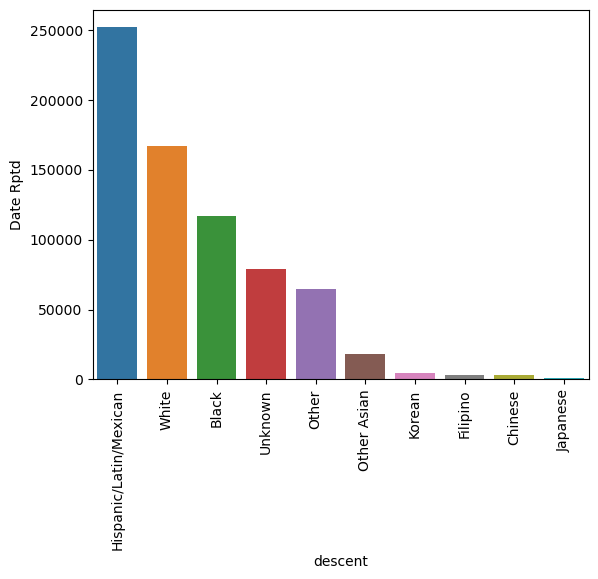

In [41]:
sns.barplot(data=crimerate_descent, x='descent', y='Date Rptd')
import matplotlib.pyplot as plt
plt.xticks(rotation ='vertical')

In [42]:
#what is most popular weapons choice by descent
descent_weapon =df.groupby(['descent', 'Weapon Desc']).count()['DR_NO'].reset_index()
print (descent_weapon)


                            descent                       Weapon Desc  DR_NO
0    American Indian/Alaskan Native  AIR PISTOL/REVOLVER/RIFLE/BB GUN      1
1    American Indian/Alaskan Native                     FOLDING KNIFE      1
2    American Indian/Alaskan Native                          HAND GUN      3
3    American Indian/Alaskan Native  KNIFE WITH BLADE 6INCHES OR LESS      3
4    American Indian/Alaskan Native                 MACE/PEPPER SPRAY      1
..                              ...                               ...    ...
533                           White                   UNKNOWN FIREARM    341
534                           White   UNKNOWN TYPE CUTTING INSTRUMENT    130
535                           White       UNKNOWN WEAPON/OTHER WEAPON   6528
536                           White                           VEHICLE    463
537                           White                     VERBAL THREAT   3978

[538 rows x 3 columns]


In [43]:
#print(descent_weapon)
descent_weapon.groupby('descent')['DR_NO'].idxmax()
#descent_weapon.loc[descent_weapon.groupby('descent')['DR_NO'].idxmax()]
#breakdown 

descent
American Indian/Alaskan Native      9
Asian Indian                       15
Black                              79
Cambodian                          93
Chinese                           104
Filipino                          118
Guamanian                         126
Hawaiian                          137
Hispanic/Latin/Mexican            200
Japanese                          220
Korean                            244
Laotian                           250
Other                             305
Other Asian                       367
Pacific Islander                  381
Samoan                            384
Unknown                           447
Vietnamese                        462
White                             525
Name: DR_NO, dtype: int64

In [44]:
descent_weapon.groupby(['descent', 'Weapon Desc']).count()['DR_NO'].max()
print(descent_weapon)

                            descent                       Weapon Desc  DR_NO
0    American Indian/Alaskan Native  AIR PISTOL/REVOLVER/RIFLE/BB GUN      1
1    American Indian/Alaskan Native                     FOLDING KNIFE      1
2    American Indian/Alaskan Native                          HAND GUN      3
3    American Indian/Alaskan Native  KNIFE WITH BLADE 6INCHES OR LESS      3
4    American Indian/Alaskan Native                 MACE/PEPPER SPRAY      1
..                              ...                               ...    ...
533                           White                   UNKNOWN FIREARM    341
534                           White   UNKNOWN TYPE CUTTING INSTRUMENT    130
535                           White       UNKNOWN WEAPON/OTHER WEAPON   6528
536                           White                           VEHICLE    463
537                           White                     VERBAL THREAT   3978

[538 rows x 3 columns]


In [45]:
descent_weapon['descent'].reset_index()

,index,descent
0,0,American Indian/Alaskan Native
1,1,American Indian/Alaskan Native
2,2,American Indian/Alaskan Native
3,3,American Indian/Alaskan Native
4,4,American Indian/Alaskan Native
...,...,...
533,533,White
534,534,White
535,535,White
536,536,White


In [46]:
df.columns
#find out most number of sex per descent  

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'LAT', 'LON', 'descent'],
      dtype='object')

In [47]:
sex_per_descent=df.groupby(['descent','Vict Sex']).count()['DR_NO'].reset_index()


In [48]:
sex_per_descent[sex_per_descent['descent']=='Asian Indian']['DR_NO'].idxmax()

4

In [49]:
sex_per_descent.loc[sex_per_descent.groupby('descent')['DR_NO'].idxmax()] #['DR_NO'], or a column, is necessary for idxmax

,descent,Vict Sex,DR_NO
1,American Indian/Alaskan Native,M,429
4,Asian Indian,M,254
6,Black,F,65489
11,Cambodian,M,31
13,Chinese,M,1630
17,Filipino,M,1701
19,Guamanian,F,29
22,Hawaiian,M,92
24,Hispanic/Latin/Mexican,F,126602
29,Japanese,M,574


In [50]:
df.columns

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'LAT', 'LON', 'descent'],
      dtype='object')

In [51]:
df['AREA NAME'].nunique()

21

In [52]:
#find out most number of vict descent by each area
#area_victim=df.groupby(['AREA NAME','descent']).count()['DR_NO'].reset_index()
area_victim.loc[area_victim.groupby(['AREA NAME']).count()['descent']]

NameError: name 'area_victim' is not defined

In [53]:
area_victim.iloc[area_victim.groupby('AREA NAME')['DR_NO'].idxmax()]

NameError: name 'area_victim' is not defined

In [54]:
df.columns

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'LAT', 'LON', 'descent'],
      dtype='object')

In [55]:
df.descent


0                          Black
1         Hispanic/Latin/Mexican
2                        Unknown
3                          White
4                        Unknown
                   ...          
820594    Hispanic/Latin/Mexican
820595    Hispanic/Latin/Mexican
820596                     Black
820597    Hispanic/Latin/Mexican
820598    Hispanic/Latin/Mexican
Name: descent, Length: 820529, dtype: object

In [56]:
#what was the most common victim age by crime description? 
Vict_Age_col=df.groupby(['Crm Cd Desc', 'Vict Age']).count()


    

In [57]:
Vict_Age_col = Vict_Age_col.reset_index()[['Crm Cd Desc', 'Vict Age','DR_NO']]

In [58]:
Vict_Age_col.loc[Vict_Age_col.groupby('Crm Cd Desc')['DR_NO'].idxmax()]

,Crm Cd Desc,Vict Age,DR_NO
0,ARSON,0,959
84,ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,0,766
127,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0,1780
227,ATTEMPTED ROBBERY,0,544
340,BATTERY - SIMPLE ASSAULT,30,1691
...,...,...,...
6455,"VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, B...",0,915
6555,VIOLATION OF COURT ORDER,36,184
6645,VIOLATION OF RESTRAINING ORDER,31,290
6740,VIOLATION OF TEMPORARY RESTRAINING ORDER,34,28


In [59]:
df['Time OCC']=pd.to_datetime(df['TIME OCC'])

In [60]:
df['Time OCC'][0].hour #integer
df['Time OCC'].info()

<class 'pandas.core.series.Series'>
Int64Index: 820529 entries, 0 to 820598
Series name: Time OCC
Non-Null Count   Dtype         
--------------   -----         
820529 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 44.8 MB


In [61]:
#df['Time OCC'][0].hour
df['Time OCC'].value_counts() #Time OCC column is useless b/c it only contains microseconds

1970-01-01 00:00:00.000001200    29169
1970-01-01 00:00:00.000001800    21824
1970-01-01 00:00:00.000001700    20611
1970-01-01 00:00:00.000002000    20205
1970-01-01 00:00:00.000001900    18797
                                 ...  
1970-01-01 00:00:00.000000756       20
1970-01-01 00:00:00.000000544       20
1970-01-01 00:00:00.000002332       18
1970-01-01 00:00:00.000000534       16
1970-01-01 00:00:00.000000531       12
Name: Time OCC, Length: 1439, dtype: int64

In [62]:
#most frequently occuring crime time for all the areas. Ex, bin of 3pm to 6pm and etc. 
#df['TIME OCC'].apply()

def time_bin(x):

    

IndentationError: expected an indented block (3097594971.py, line 6)

In [63]:
df['timeconvert'].value_counts()

KeyError: 'timeconvert'

In [64]:
df['Date Rptd'].info()
df['DATE OCC'].info()

<class 'pandas.core.series.Series'>
Int64Index: 820529 entries, 0 to 820598
Series name: Date Rptd
Non-Null Count   Dtype         
--------------   -----         
820529 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 44.8 MB
<class 'pandas.core.series.Series'>
Int64Index: 820529 entries, 0 to 820598
Series name: DATE OCC
Non-Null Count   Dtype         
--------------   -----         
820529 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 44.8 MB


In [65]:
(df['Date Rptd'] == df['DATE OCC']).sum()
df['Date Rptd'].info()
print ('this is true',(df['Date Rptd'] == df['DATE OCC']).sum())
print ('this is false',820529-(df['Date Rptd'] == df['DATE OCC']).sum())

<class 'pandas.core.series.Series'>
Int64Index: 820529 entries, 0 to 820598
Series name: Date Rptd
Non-Null Count   Dtype         
--------------   -----         
820529 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 44.8 MB
this is true 405492
this is false 415037


In [66]:
df['Date Rptd'][0].month

1

In [67]:
#month 1-4 is spring
#month 5-8 is summer
#month 9-10 is fall 
#month 11-12 is winter
def bin(x):
    if 1<=x.month<=4:
        return 'spring'
    elif 5<=x.month<=8:
        return 'summer'
    elif 9<=x.month<=10:
        return 'fall'
    elif 11<=x.month<=12:
        return 'winter'

df['month_binned']=df['Date Rptd'].apply(bin)
    

In [68]:
df['month_binned']

0         spring
1         spring
2         spring
3         spring
4         spring
           ...  
820594    spring
820595    spring
820596    spring
820597    summer
820598    spring
Name: month_binned, Length: 820529, dtype: object

In [69]:
df['month_binned'].nunique()
df['month_binned'].unique()


array(['spring', 'summer', 'winter', 'fall'], dtype=object)

In [70]:
#which period had most number of crimes? 
df.groupby('month_binned').count()['DR_NO'].idxmax()

'summer'

<AxesSubplot:xlabel='month_binned', ylabel='DR_NO'>

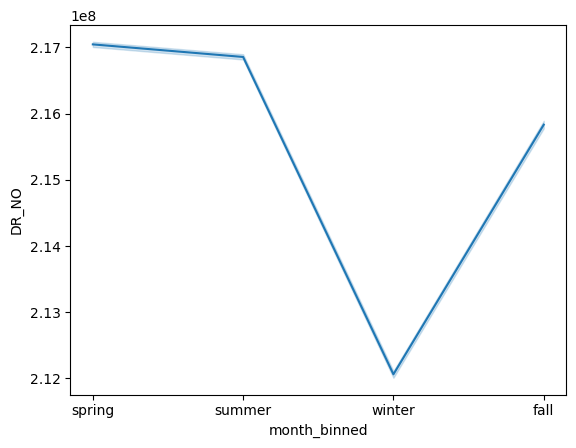

In [71]:
data=df.groupby('month_binned').count()['DR_NO']
sns.lineplot(data=df, y='DR_NO', x='month_binned') #above, summer period had the most number of crimes using df.groupby.count(); however, sns line graph below indicates Spring has the most number of crimes b/c SNS is using means aggregator for its groupby/hue.
#sns lineplot does not have count aggregator, but it has mean aggregator. SNS barplot does have count aggregator, use estimator =len

In [72]:
#df.month_binned.sort_values(False)
month_plot=df.groupby('month_binned').size().reset_index(name='number').sort_values('number', ascending=False) #when I reset the index, index zero 0 had no name that's why it got named 0. That's why I don't str 0 index when I call it inside sort_values() function.
#inside reset_index function, the name parameter assigns the index name for those indice without a name. 

<AxesSubplot:xlabel='month_binned', ylabel='number'>

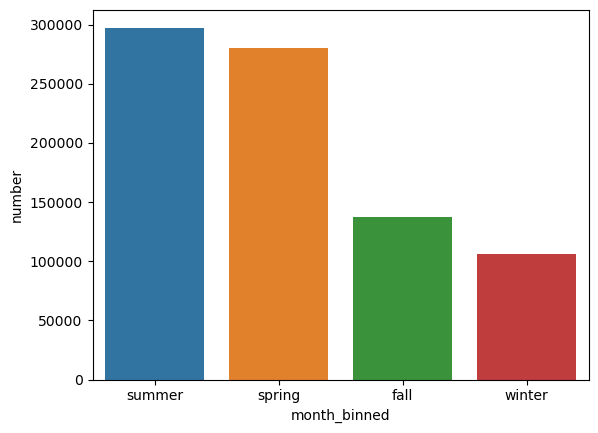

In [73]:
sns.barplot(data=month_plot, x='month_binned', y='number') 
#sns.barplot(data=df, x='month_binned', y='DR_NO', estimator = len) #estimator can be np.mean, np.median. Estimator counts how many x is there.

In [96]:
#scenario1: What type of crime (crime code) is most likely to occur based on area, descent, age, victim age/sex? 
#x=area, descent, victim age/sex
#y=crime code ['Crm Cd Desc']

#steps?
x=['AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']
x_wo_descent=['AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']
df=df.dropna()

In [75]:
df.columns

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'LOCATION',
       'LAT', 'LON', 'descent', 'Time OCC', 'month_binned'],
      dtype='object')

In [81]:
from sklearn import svm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score 
clf=svm.SVC(gamma=0.001, C=100.)
#I need to encode x b/c it's categorical right now. 
le=LabelEncoder()
#convert crime code description, the y, to numbers using label encoder
df[['Crm Cd Desc', 'AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']]=df[['Crm Cd Desc', 'AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']].apply(le.fit_transform)




C:\Users\peace\AppData\Local\Temp\ipykernel_5692\810326594.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Crm Cd Desc', 'AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']]=df[['Crm Cd Desc', 'AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']].apply(le.fit_transform)


In [77]:
df['Crm Cd Desc']

0          4
1          4
5         77
10        16
11        32
          ..
820585    81
820588    32
820589     4
820595     2
820596     2
Name: Crm Cd Desc, Length: 285190, dtype: int32

In [99]:
x_train, x_test, y_train, y_test = train_test_split(df[x], df['Crm Cd Desc'], random_state=42, test_size=0.3)
clf.fit(x_train, y_train)
y_predict=clf.predict(x_test)
accuracy=accuracy_score(y_test, y_predict)
print(accuracy)


0.2939326998375352


In [88]:
sample_df=df[['Crm Cd Desc', 'AREA', 'Vict Descent', 'Vict Age', 'Vict Sex']].sample(n=5000, random_state=42)


In [92]:
#correlation= df.corr
#positive and negative correlation 
sample_df.corr(method='pearson')

,Crm Cd Desc,AREA,Vict Descent,Vict Age,Vict Sex
Crm Cd Desc,1.000000,-0.005118,0.073353,-0.100457,-0.057994
AREA,-0.005118,1.000000,-0.007003,0.003283,-0.043976
Vict Descent,0.073353,-0.007003,1.000000,-0.158514,0.253625
Vict Age,-0.100457,0.003283,-0.158514,1.000000,-0.148032
Vict Sex,-0.057994,-0.043976,0.253625,-0.148032,1.000000


In [98]:
#let's remove column(s) from sample_df to make the correlation higher or lower
sample_df_wodescent=df[['Crm Cd Desc', 'AREA', 'Vict Age', 'Vict Sex']].sample(n=5000, random_state=42)
x_train, x_test, y_train, y_test = train_test_split(sample_df_wodescent[['AREA', 'Vict Age', 'Vict Sex']], sample_df_wodescent['Crm Cd Desc'], random_state=42, test_size=0.3)
clf.fit(x_train, y_train)
y_predict=clf.predict(x_test)
accuracy=accuracy_score(y_test, y_predict)
print(accuracy)


0.2866666666666667


In [89]:
print(sample_df)

        Crm Cd Desc  AREA  Vict Descent  Vict Age  Vict Sex
741893           56     4             6        38         2
113496            0    11            17         0         3
282753           66     9             6        73         0
555516           15     1            17         0         3
141869           56    17             6        35         0
...             ...   ...           ...       ...       ...
221968           59    12             6        15         0
768338           32     0             1        45         2
70896             2     7            11        50         2
726656            2     4            16        39         2
176205           81    17             1        28         2

[5000 rows x 5 columns]


In [90]:
x_train, x_test, y_train, y_test = train_test_split(sample_df[x], sample_df['Crm Cd Desc'], random_state=42, test_size=0.3)
clf.fit(x_train, y_train)
y_predict=clf.predict(x_test)
accuracy=accuracy_score(y_test, y_predict)
print(accuracy)

0.2926666666666667
